# Swithching Power

In [1]:
import pandas as pd
import mpld3
import numpy as np
import matplotlib.pyplot as plt

In [2]:
mpld3.enable_notebook()

df_waves = pd.read_csv('lossesHalfBridge.csv')
df_waves = df_waves.set_index('Time')
df_waves.head()

,I(L1),Iout,I(IGBT1),count,V2,V3,V6,count1,V13,V14,Vout,vag,Vsa1
Time,,,,,,,,,,,,,
0.016667,-0.547685,0.749702,-0.547680,44,0.524595,0,1,0,0,0,0.749703,50.0,1
0.016667,-0.499183,0.748429,-0.499178,43,0.524595,0,1,0,0,0,0.748430,50.0,1
0.016667,-0.450679,0.747207,-0.450674,42,0.524595,0,1,0,0,0,0.747207,50.0,1
0.016668,-0.402172,0.746034,-0.402167,41,0.524595,0,1,0,0,0,0.746034,50.0,1
0.016668,-0.353663,0.744910,-0.353658,40,0.524595,0,1,0,0,0,0.744911,50.0,1


In [3]:
df_waves.tail()

,I(L1),Iout,I(IGBT1),count,V2,V3,V6,count1,V13,V14,Vout,vag,Vsa1
Time,,,,,,,,,,,,,
0.033333,3.17670,2.09451,0.0,92,0.549097,0,0,0,0,0,2.09451,-0.000032,0
0.033333,3.12251,2.09556,0.0,93,0.549097,0,0,0,0,0,2.09556,-0.000031,0
0.033333,3.06832,2.09656,0.0,94,0.549097,0,0,0,0,0,2.09656,-0.000031,0
0.033333,3.01412,2.09751,0.0,95,0.549097,0,0,0,0,0,2.09751,-0.000030,0
0.033333,2.95993,2.09840,0.0,96,0.549097,0,0,0,0,0,2.09840,-0.000030,0


In [4]:
df_waves.columns

time   = np.array(df_waves.index)
pwm_s1 = np.array(df_waves['Vsa1'])
Iout   = np.array(df_waves['Iout'])

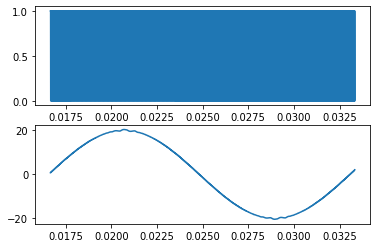

In [5]:
plt.subplot(211)
plt.plot(time, pwm_s1)
plt.subplot(212)
plt.plot(time, Iout)
plt.show()

In [6]:
from halfBridgeModule import detectCommutation, switchingLosesHalfBridge

## Importando os modelos

In [7]:
import pickle

with open('models/SKM400GB125D.pklmod', 'rb') as filep:
    loaded = pickle.load(filep)

In [8]:
p_eon, p_eoff, p_erec, _ = loaded.values()
p_eDon = np.poly1d([0])

print('eon_params:', p_eon)
print('')
print('eoff_params:', p_eoff)
print('')
print('erec_params:', p_erec)
print('')
print('eDon_params:', p_eDon)

eon_params:           3            2
1.23e-10 x + 1.39e-08 x + 6.96e-05 x + 0.00464

eoff_params:           3            2
1.72e-10 x - 1.57e-07 x + 0.000105 x - 0.00104

erec_params:           3            2
7.25e-11 x - 1.32e-07 x + 8.53e-05 x + 0.00181

eDon_params:  
0


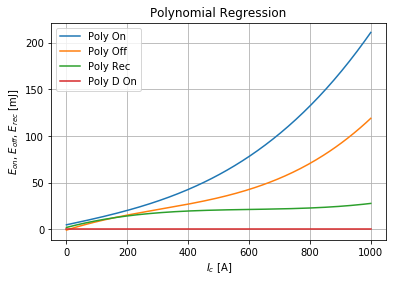

In [9]:
import numpy as np
import matplotlib.pyplot as plt

i = np.linspace(0, 1000, 200)

eon  = p_eon(i)
eoff = p_eoff(i)
erec = p_erec(i)
eDon = p_eDon(i)

plt.plot(i, eon*1e3, label='Poly On')
plt.plot(i, eoff*1e3, label='Poly Off')
plt.plot(i, erec*1e3, label='Poly Rec')
plt.plot(i, eDon*1e3, label='Poly D On')
plt.title('Polynomial Regression') 
plt.xlabel('$I_c$ [A]') 
plt.ylabel('$E_{on}$, $E_{off}$, $E_{rec}$ [mJ]')
plt.grid()
plt.legend()
# plt.yticks(np.arange(0, 110, 10))
# plt.xticks(np.arange(100, 650, 50))
# plt.xlim(50, 625)
plt.show()

In [10]:
P_sw = switchingLosesHalfBridge(pwm_s1, Iout, time[-1] - time[0], p_eon, p_eoff, p_erec, p_eDon)

# of (positive) Commutations per sec =  50462.62405645093
# of (negative) Commutations per sec =  50522.62717661318


## Resultado Final das potências dissipadas de cada um dos semicondutores $S_1$, $S_2$, $D_1$ e $D_2$ , em Watts

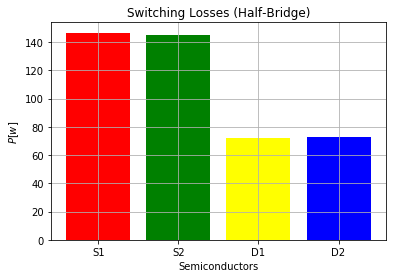

In [11]:
mpld3.disable_notebook()

x = np.arange(4)
plt.bar(x, P_sw.values(), color =['red', 'green', 'yellow', 'blue'])
plt.xticks(x, P_sw.keys())
plt.ylabel('$P [w]$')
plt.xlabel('Semiconductors')
plt.grid()
plt.title('Switching Losses (Half-Bridge)')
plt.show()

mpld3.enable_notebook()